In [1]:
# Import libraries
import pandas as pd
import numpy as np
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import log_loss, average_precision_score, accuracy_score, make_scorer, confusion_matrix
import plotly.express as px
from sklearn.metrics import precision_recall_curve, auc

# Exploratory Analysis

In [2]:
# Load data
cc = pd.read_csv('BankChurners.csv')
cc.shape

(10127, 21)

In [3]:
cc.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [4]:
# Check for missing data
cc.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [5]:
# Split data into training, validation, and test data with a 70%, 15%, 15% split

x_train, x_test, y_train, y_test = train_test_split(cc.drop(['Attrition_Flag'], axis=1),
                                                    cc['Attrition_Flag'],
                                                    train_size = 0.70,
                                                    random_state=11,
                                                    stratify=cc['Attrition_Flag'])
x_val, x_test, y_val, y_test = train_test_split(x_test, 
                                                y_test, 
                                                test_size=0.50, 
                                                random_state=11)

In [7]:
# Use pandas-profiling to create a report of the data
pp.ProfileReport(x_train).to_notebook_iframe()

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# CLIENTNUM is a unique identified for each customer, so I can remove it from the data
x_train.drop(['CLIENTNUM'], axis=1, inplace=True)

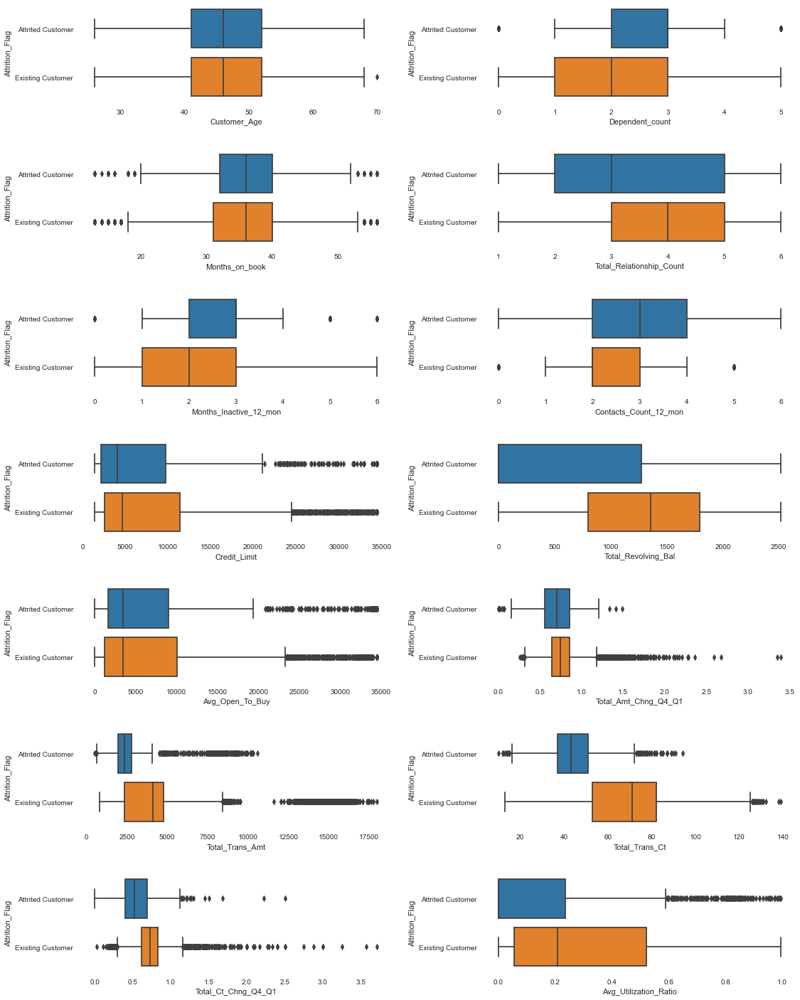

In [7]:
# Create boxplots of numerical variables to compare exisiting and attrited customers
num_vars = x_train.select_dtypes(include=[np.int64, np.float64]).columns.tolist()
train = pd.concat([x_train, y_train], axis=1)

fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(18,25))
fig.subplots_adjust(hspace=0.5, wspace=0.3)
sns.set_style(style='whitegrid')
for var, ax in zip(num_vars, axes.flatten()):
    sns.boxplot(x=var, y=y_train, data=train, ax=ax)

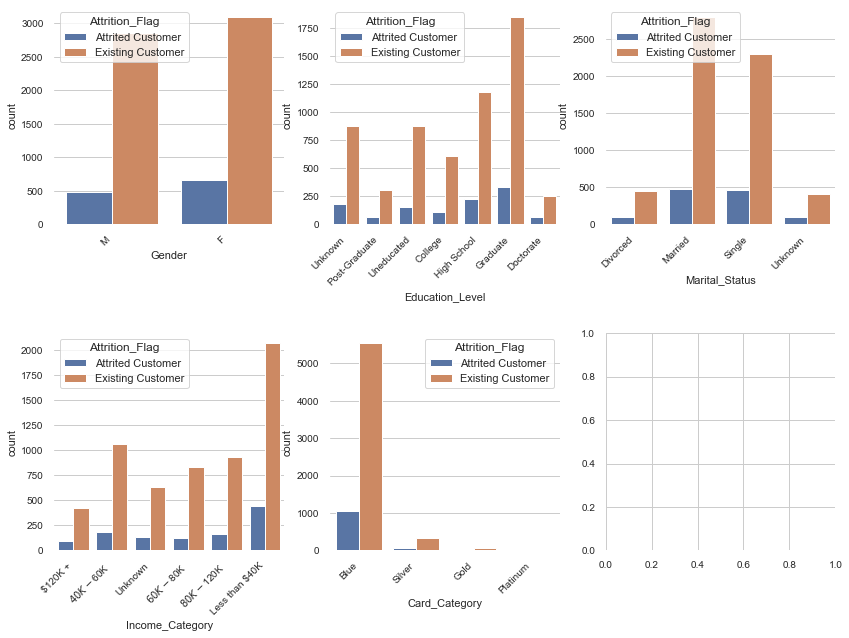

In [8]:
# Create bar plots of categorical variables to compare exisiting and attrited customers
cat_vars = x_train.select_dtypes(include=[object]).columns.tolist()

fig, axes = plt.subplots(2, 3, figsize=(14, 10))
fig.subplots_adjust(hspace=0.5)
sns.set_theme(style='whitegrid')
for var, ax in zip(cat_vars, axes.flatten()):
    sns.countplot(data=train, x=var, hue=y_train, ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

# Data Transformations

In [9]:
# Convert binary variables Attrition_Flag and Gender
def binary_target(val):
    if (val == 'Existing Customer' or val == 'F'):
        return 0
    else:
        return 1

# Convert categorical variables    
cat_to_num = {'Education_Level': {'Unknown': 0, 'Uneducated': 1, 'High School': 2, 'College': 3, 'Graduate': 4, 
                                  'Post-Graduate': 5, 'Doctorate': 6},
              'Marital_Status': {'Unknown': 0, 'Single': 1, 'Married': 2, 'Divorced': 3},
              'Income_Category': {'Unknown': 0, 'Less than $40K': 1, '$40K - $60K': 2, '$60K - $80K': 3,
                                  '$80K - $120K': 4, '$120K +': 5},
              'Card_Category': {'Blue': 0, 'Silver': 1, 'Gold': 2, 'Platinum': 3}}

In [10]:
x_train['Gender'] = x_train.Gender.map(binary_target)
y_train = y_train.map(binary_target)
              
x_train = x_train.replace(cat_to_num)

# Variable Selection

In [11]:
# First, I need to transform the validation data
x_val['Gender'] = x_val.Gender.map(binary_target)
y_val = y_val.map(binary_target)

x_val = x_val.replace(cat_to_num)

# Remove CLIENTNUM from x_val
x_val.drop(['CLIENTNUM'], axis=1, inplace=True)

In [12]:
# Use decision tree to decide feature importance
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=11)
# fit the model
model.fit(x_train, y_train)
# get importance
importance = model.feature_importances_
# summarize feature importance
feature_importance = pd.DataFrame(importance, index=x_train.columns, 
                                  columns=['importance']).sort_values('importance', ascending=False)
print(feature_importance)

                          importance
Total_Trans_Ct              0.273083
Total_Revolving_Bal         0.193611
Total_Trans_Amt             0.162229
Total_Relationship_Count    0.078886
Total_Ct_Chng_Q4_Q1         0.078211
Total_Amt_Chng_Q4_Q1        0.048730
Months_on_book              0.024918
Contacts_Count_12_mon       0.024501
Customer_Age                0.023686
Months_Inactive_12_mon      0.020102
Credit_Limit                0.017269
Avg_Open_To_Buy             0.012605
Avg_Utilization_Ratio       0.011779
Dependent_count             0.007302
Education_Level             0.007140
Card_Category               0.004897
Marital_Status              0.004625
Income_Category             0.004050
Gender                      0.002375


In [13]:
# I will use the first 13 variables, which contains the top 97% importance
features = list(feature_importance.index[0:13])

# Model Selection

## Naive Bayes Classifier

In [14]:
gnb = GaussianNB()
gnb.fit(x_train[features], y_train)
gnb_y_pred = gnb.predict(x_val[features])
print('AUC Precision-Recall:', average_precision_score(y_val, gnb_y_pred))
print('Log Loss:', log_loss(y_val, gnb_y_pred))
print('Accuracy:', accuracy_score(y_val, gnb_y_pred))

AUC Precision-Recall: 0.5506155942852523
Log Loss: 3.1605916355074575
Accuracy: 0.9084924292297564


## Decision Tree Classifier

In [15]:
dt = DecisionTreeClassifier(random_state=11)
dt.fit(x_train[features], y_train)
dt_y_pred = dt.predict(x_val[features])
print('AUC Precision-Recall:', average_precision_score(y_val, dt_y_pred))
print('Log Loss:', log_loss(y_val, dt_y_pred))
print('Accuracy:', accuracy_score(y_val, dt_y_pred))

AUC Precision-Recall: 0.6722580645161291
Log Loss: 2.2283339479758575
Accuracy: 0.9354838709677419


## Random Forest Classifier

In [16]:
rf = RandomForestClassifier(random_state=11)
rf.fit(x_train[features], y_train)
rf_y_pred = rf.predict(x_val[features])
print('AUC Precision-Recall:', average_precision_score(y_val, rf_y_pred))
print('Log Loss:', log_loss(y_val, rf_y_pred))
print('Accuracy:', accuracy_score(y_val, rf_y_pred))

AUC Precision-Recall: 0.7886913905347085
Log Loss: 1.3642808266249151
Accuracy: 0.9605003291639236


## Gradient Boosting Classifier

In [17]:
gboost = GradientBoostingClassifier(random_state=11)
gboost.fit(x_train[features],y_train)
gboost_y_pred = gboost.predict(x_val[features])
print('AUC Precision-Recall:', average_precision_score(y_val, gboost_y_pred))
print('Log Loss:', log_loss(y_val, gboost_y_pred))
print('Accuracy:', accuracy_score(y_val, gboost_y_pred))

AUC Precision-Recall: 0.823205613794773
Log Loss: 1.136899285128083
Accuracy: 0.9670836076366031


## eXtreme Gradient Boosting

In [18]:
xgb_clf = XGBClassifier(random_state=11)
xgb_clf.fit(x_train[features],y_train)
xgb_y_pred = xgb_clf.predict(x_val[features])
print('AUC Precision-Recall:', average_precision_score(y_val, xgb_y_pred))
print('Log Loss:', log_loss(y_val, xgb_y_pred))
print('Accuracy:', accuracy_score(y_val, xgb_y_pred))

C:\Users\femaa001\Anaconda3\envs\r_env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:50:03] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUC Precision-Recall: 0.8397049798596311
Log Loss: 1.0232121991604513
Accuracy: 0.9703752468729427


# Parameter Tuning

In [19]:
# Combine training and validation data
x_train = pd.concat([x_train, x_val])
y_train = pd.concat([y_train, y_val])

In [20]:
param_dist = {'learning_rate' : [0.001,0.01,0.05,0.1,0.5,0.55], 
              'max_depth' : [5, 10, 15, 20], 
              'min_child_weight' : [1, 5, 10], 
              'gamma': [0.5, 1, 1.5, 2, 5],
              'n_estimators': [100, 150, 175, 200, 250], 
              'subsample': [0.6, 0.8, 1.0],
              'colsample_bytree': [0.6, 0.8, 1.0]}


gboost = RandomizedSearchCV(XGBClassifier(random_state=11), param_distributions = param_dist, cv=5, 
                            n_iter = 30, n_jobs=-1, random_state=11)

search = gboost.fit(x_train, y_train)
search.best_params_

C:\Users\femaa001\Anaconda3\envs\r_env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:52:24] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


{'subsample': 0.8,
 'n_estimators': 250,
 'min_child_weight': 1,
 'max_depth': 5,
 'learning_rate': 0.05,
 'gamma': 1.5,
 'colsample_bytree': 0.8}

In [21]:
xgboost = XGBClassifier(n_estimators=250, min_child_weight=1, subsample=0.8, max_depth=5, 
                              learning_rate=0.05, gamma=1.5, colsample_bytree=0.8, random_state=11)

# Model Evaluation

In [22]:
# Fit on training data
xgboost.fit(x_train[features], y_train)

[19:53:07] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=1.5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=250, n_jobs=8, num_parallel_tree=1, random_state=11,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [23]:
# Transform test data
x_test['Gender'] = x_test.Gender.map(binary_target)
x_test = x_test.replace(cat_to_num)
y_test = y_test.map(binary_target)

# Remove CLIENTNUM from x_test
x_test.drop(['CLIENTNUM'], axis=1, inplace=True)

In [24]:
# See how well the model fits the 
y_pred = xgboost.predict(x_train[features])
print('AUC Precision-Recall:', average_precision_score(y_train, y_pred))
print('Log Loss:', log_loss(y_train, y_pred))
print('Accuracy:', accuracy_score(y_train, y_pred))

AUC Precision-Recall: 0.9400837029979753
Log Loss: 0.3772125211394316
Accuracy: 0.9890786569071686


In [25]:
# Predict on the test data
y_pred = xgboost.predict(x_test[features])
print('AUC Precision-Recall:', average_precision_score(y_test, y_pred))
print('Log Loss:', log_loss(y_test, y_pred))
print('Accuracy:', accuracy_score(y_test, y_pred))

AUC Precision-Recall: 0.8469427405301111
Log Loss: 0.9770885403671267
Accuracy: 0.9717105263157895


In [37]:
y_score.shape

(1520,)

In [44]:
# Create AUC Precision-Recall
y_score = xgboost.predict_proba(x_test[features])[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_score)


fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AUC={average_precision_score(y_test, y_pred):.3f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)

fig.update_layout(font=dict(size=18)
)

fig.show()

In [45]:
def convert_target(val):
    if (val == 0):
        return 'Existing Customer'
    else:
        return 'Attrited Customer'

In [46]:
y_test = y_test.map(convert_target)
y_pred = np.where(y_pred==0, 'Existing Customer', 'Attrited Customer') 

In [47]:
# Create confusion matrix
def cm_analysis(y_true, y_pred, filename, labels, ymap=None, figsize=(10,10)):
    if ymap is not None:
        y_pred = [ymap[yi] for yi in y_pred]
        y_true = [ymap[yi] for yi in y_true]
        labels = [ymap[yi] for yi in labels]
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=labels, columns=labels)
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    sns.set(font_scale=2)
    sns.heatmap(cm, annot=annot, fmt='', ax=ax)
    plt.savefig(filename)

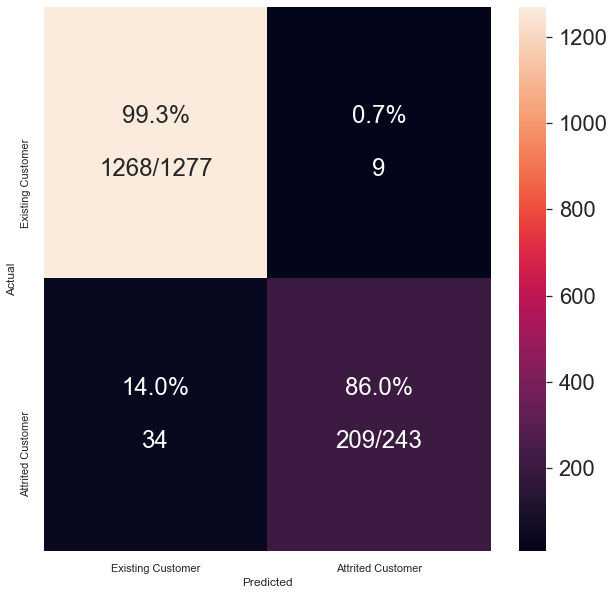

In [48]:
labels = ['Existing Customer', 'Attrited Customer']
cm_analysis(y_test, y_pred, 'cm.png', labels=labels, ymap=None, figsize=(10,10))